In [1]:
import re    # for regular expressions 
import nltk  # for text manipulation 
import string 
import warnings 
import numpy as np 
import pandas as pd 
import seaborn as sns 
import matplotlib.pyplot as plt  

pd.set_option("display.max_colwidth", 200) 
warnings.filterwarnings("ignore", category=DeprecationWarning) 

%matplotlib inline

In [2]:
import os
os.chdir(r"C:\Users\lenovo\Desktop\Praxis\Text analysis")

In [3]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import numpy as np # linear algebra
import os # accessing directory structure
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.animation as animation
from matplotlib.widgets import Slider

from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook

import matplotlib.patches as patches
from matplotlib import rc

rc('animation', html='jshtml')
stopwords = set(STOPWORDS)

In [28]:
data = pd.read_csv("/Users/arjunsingh/Desktop/Text_Analytics/US_covid19Tweets.csv")

In [29]:
data.head()

,created_at,text,country_code,Label
0,2020-03-24T00:00:07Z,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia...",US,1
1,2020-03-24T00:00:15Z,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19,US,0
2,2020-03-24T00:00:23Z,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...,US,0
3,2020-03-24T00:00:28Z,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the @GSSChamber are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\...,US,0
4,2020-03-24T00:00:43Z,@_DCHealth latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO,US,0


In [32]:
#Given below is a user-defined function to remove unwanted text patterns from the tweets.

def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for i in r:
        input_txt = re.sub(i, '', input_txt)
    return input_txt

#### 1. Removing Twitter Handles (@user)

In [33]:
data['clean_tweet'] = np.vectorize(remove_pattern)(data['text'], "@[\w]*") 
data.head()

,created_at,text,country_code,Label,clean_tweet
0,2020-03-24T00:00:07Z,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia...",US,1,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia..."
1,2020-03-24T00:00:15Z,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19,US,0,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19
2,2020-03-24T00:00:23Z,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...,US,0,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...
3,2020-03-24T00:00:28Z,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the @GSSChamber are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\...,US,0,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\n\nhttps://...
4,2020-03-24T00:00:43Z,@_DCHealth latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO,US,0,latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO


#### 2. Removing Punctuations, Numbers, and Special Characters

In [35]:
#remove URLs
data['clean_tweet'] = data['clean_tweet'].str.replace("([^0-9A-Za-z \t])|(\w+:\/\/\S+)", " ") 
data.head(10)


,created_at,text,country_code,Label,clean_tweet
0,2020-03-24T00:00:07Z,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia...",US,1,My nieces and nephews made this little FedEx truck to deliver messages back and forth to my mom s front door during the lockdown Keeping their Grandma connected happy and safe StayHome Socia...
1,2020-03-24T00:00:15Z,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19,US,0,People need to StayAtHome the US numbers are growing exponentially every day Over 100 deaths today This is terrible CoronavirusNewYork CoronavirusPandemic COVID 19
2,2020-03-24T00:00:23Z,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...,US,0,Day 7 of quarantine and the mood is here Quarantine QuarantineLife QuarantineActivities CoronavirusPandemic CoronavirusUSA denver fortcollins boulder photography photoshoot model
3,2020-03-24T00:00:28Z,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the @GSSChamber are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\...,US,0,ICYMI The SilverSpring Arts amp Entertainment District and the are building lists of local restaurants and other businesses open to serve customers during the COVID19 emergency DTSS ...
4,2020-03-24T00:00:43Z,@_DCHealth latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO,US,0,latest coronavirus numbers as of 1930 today It s a low and slow burn here in dc Now reporting recoveries at 17 Some good news here
5,2020-03-24T00:00:44Z,RTC reducing residential bus service amid 30-day Nevada shutdown https://t.co/b4XZLsTOFE #vegas #Coronavirus #Transportation,US,0,RTC reducing residential bus service amid 30 day Nevada shutdown vegas Coronavirus Transportation
6,2020-03-24T00:00:48Z,"Me when there's too many ppl crowding my spot.😂\nBut in all seriousness, call 311 to report ppl not following restrictions &amp; report non-essential businesses forcing u to go to work. #DallasLoc...",US,0,Me when there s too many ppl crowding my spot But in all seriousness call 311 to report ppl not following restrictions amp report non essential businesses forcing u to go to work DallasLock...
7,2020-03-24T00:00:50Z,"""Seniors are sedated so they dont suffer."" #coronavirus two days ago in Spain. https://t.co/cUe4Dv2NxE",US,0,Seniors are sedated so they dont suffer coronavirus two days ago in Spain
8,2020-03-24T00:01:07Z,@GavinNewsom so far is really ahead in the #COVID19 handling its almost like he read all the papers coming out almost daily 👍 https://t.co/9ezVHwv2ti,US,0,so far is really ahead in the COVID19 handling its almost like he read all the papers coming out almost daily
9,2020-03-24T00:01:18Z,"“I’m not interested in myself, I’m interested in the American people.”\n\nLies the most narcissistic president ever.\n\n#COVID #COVIDー19 #Coronavirus",US,0,I m not interested in myself I m interested in the American people Lies the most narcissistic president ever COVID COVID 19 Coronavirus


In [36]:
data['clean_tweet'] = data['clean_tweet'].str.replace("[^a-zA-Z#]", " ") 
data.head(10)

,created_at,text,country_code,Label,clean_tweet
0,2020-03-24T00:00:07Z,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia...",US,1,My nieces and nephews made this little FedEx truck to deliver messages back and forth to my mom s front door during the lockdown Keeping their Grandma connected happy and safe StayHome Socia...
1,2020-03-24T00:00:15Z,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19,US,0,People need to StayAtHome the US numbers are growing exponentially every day Over deaths today This is terrible CoronavirusNewYork CoronavirusPandemic COVID
2,2020-03-24T00:00:23Z,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...,US,0,Day of quarantine and the mood is here Quarantine QuarantineLife QuarantineActivities CoronavirusPandemic CoronavirusUSA denver fortcollins boulder photography photoshoot model
3,2020-03-24T00:00:28Z,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the @GSSChamber are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\...,US,0,ICYMI The SilverSpring Arts amp Entertainment District and the are building lists of local restaurants and other businesses open to serve customers during the COVID emergency DTSS ...
4,2020-03-24T00:00:43Z,@_DCHealth latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO,US,0,latest coronavirus numbers as of today It s a low and slow burn here in dc Now reporting recoveries at Some good news here
5,2020-03-24T00:00:44Z,RTC reducing residential bus service amid 30-day Nevada shutdown https://t.co/b4XZLsTOFE #vegas #Coronavirus #Transportation,US,0,RTC reducing residential bus service amid day Nevada shutdown vegas Coronavirus Transportation
6,2020-03-24T00:00:48Z,"Me when there's too many ppl crowding my spot.😂\nBut in all seriousness, call 311 to report ppl not following restrictions &amp; report non-essential businesses forcing u to go to work. #DallasLoc...",US,0,Me when there s too many ppl crowding my spot But in all seriousness call to report ppl not following restrictions amp report non essential businesses forcing u to go to work DallasLock...
7,2020-03-24T00:00:50Z,"""Seniors are sedated so they dont suffer."" #coronavirus two days ago in Spain. https://t.co/cUe4Dv2NxE",US,0,Seniors are sedated so they dont suffer coronavirus two days ago in Spain
8,2020-03-24T00:01:07Z,@GavinNewsom so far is really ahead in the #COVID19 handling its almost like he read all the papers coming out almost daily 👍 https://t.co/9ezVHwv2ti,US,0,so far is really ahead in the COVID handling its almost like he read all the papers coming out almost daily
9,2020-03-24T00:01:18Z,"“I’m not interested in myself, I’m interested in the American people.”\n\nLies the most narcissistic president ever.\n\n#COVID #COVIDー19 #Coronavirus",US,0,I m not interested in myself I m interested in the American people Lies the most narcissistic president ever COVID COVID Coronavirus


#### 3. Removing Short Words

In [37]:
data['clean_tweet'] = data['clean_tweet'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))
data.head()

,created_at,text,country_code,Label,clean_tweet
0,2020-03-24T00:00:07Z,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia...",US,1,nieces nephews made this little FedEx truck deliver messages back forth front door during lockdown Keeping their Grandma connected happy safe StayHome SocialDistancing Coronavirus FedEx
1,2020-03-24T00:00:15Z,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19,US,0,People need StayAtHome numbers growing exponentially every Over deaths today This terrible CoronavirusNewYork CoronavirusPandemic COVID
2,2020-03-24T00:00:23Z,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...,US,0,quarantine mood here Quarantine QuarantineLife QuarantineActivities CoronavirusPandemic CoronavirusUSA denver fortcollins boulder photography photoshoot model
3,2020-03-24T00:00:28Z,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the @GSSChamber are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\...,US,0,ICYMI SilverSpring Arts Entertainment District building lists local restaurants other businesses open serve customers during COVID emergency DTSS MoCo MoCoMD Coronavirus
4,2020-03-24T00:00:43Z,@_DCHealth latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO,US,0,latest coronavirus numbers today slow burn here reporting recoveries Some good news here


#### 4. Displaying datewise animation of prominent words used 

In [41]:
data["created_at"] = pd.to_datetime(data["created_at"])

In [42]:
data["creation_date"] = data["created_at"].dt.date
data.head()

,created_at,text,country_code,Label,clean_tweet,creation_date
0,2020-03-24 00:00:07+00:00,"My nieces and nephews made this little FedEx truck to deliver messages back-and-forth to my mom’s front door during the lockdown. Keeping their Grandma connected, happy, and safe! #StayHome #Socia...",US,1,nieces nephews made this little FedEx truck deliver messages back forth front door during lockdown Keeping their Grandma connected happy safe StayHome SocialDistancing Coronavirus FedEx,2020-03-24
1,2020-03-24 00:00:15+00:00,People need to #StayAtHome the US numbers are growing exponentially every day. Over 100 deaths today. This is terrible. #CoronavirusNewYork #CoronavirusPandemic #COVIDー19,US,0,People need StayAtHome numbers growing exponentially every Over deaths today This terrible CoronavirusNewYork CoronavirusPandemic COVID,2020-03-24
2,2020-03-24 00:00:23+00:00,Day 7 of quarantine and the mood is here. \n#Quarantine #QuarantineLife #QuarantineActivities #CoronavirusPandemic #CoronavirusUSA #denver #fortcollins #boulder #photography #photoshoot #model htt...,US,0,quarantine mood here Quarantine QuarantineLife QuarantineActivities CoronavirusPandemic CoronavirusUSA denver fortcollins boulder photography photoshoot model,2020-03-24
3,2020-03-24 00:00:28+00:00,#ICYMI: The #SilverSpring Arts &amp; Entertainment District and the @GSSChamber are building lists of local restaurants and other businesses open to serve customers during the #COVID19 emergency:\...,US,0,ICYMI SilverSpring Arts Entertainment District building lists local restaurants other businesses open serve customers during COVID emergency DTSS MoCo MoCoMD Coronavirus,2020-03-24
4,2020-03-24 00:00:43+00:00,@_DCHealth latest #coronavirus numbers as of 1930 today. It’s a low and slow burn here in #dc. Now reporting recoveries at 17! Some good news here. https://t.co/836cbrgrLO,US,0,latest coronavirus numbers today slow burn here reporting recoveries Some good news here,2020-03-24


#### Filtering only tweets with preventive actions

In [43]:
df_preventive = data[data['Label'] == 1]
df_others = data[data['Label'] == 0]

### Animation for preventive tweets

In [64]:
stopwords.update(["Covid19", "Covid 19", "Covid_19", "CoronaVirus", "Coronavirus", "CoronavirusOutbreak", "https","CO","COVID","Corona","CoronaAlert","Coronvirus","CoronaVirusUpdate","CoronavirusUSA","Please"])

In [65]:
def get_word_count(df_preventive):
    return WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=50,
        max_font_size=40, 
        scale=5,
        random_state=1,
        collocations=False
    ).generate(str(df_preventive))

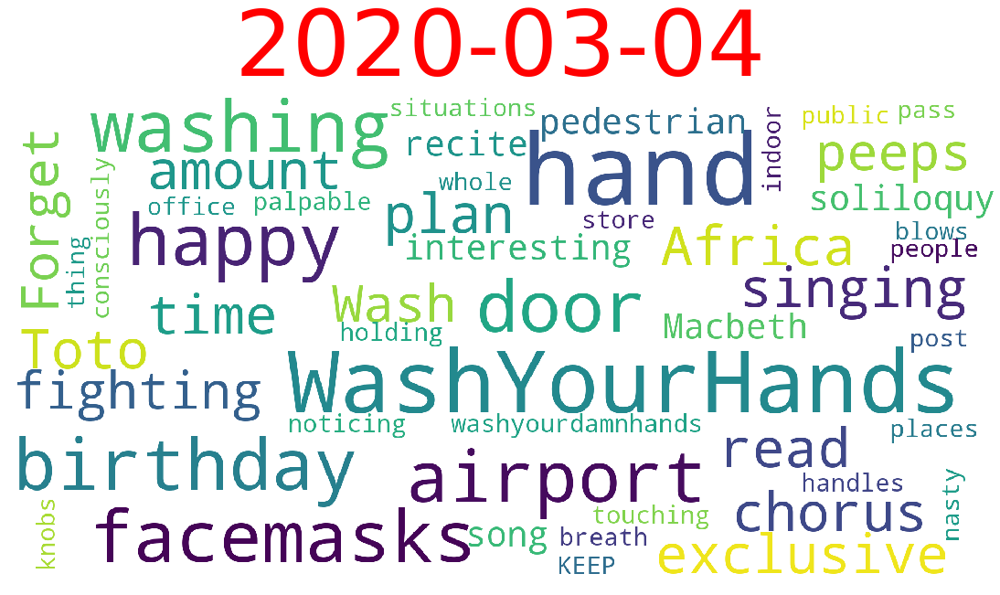

In [66]:
dates, snapshots = zip(*[ (date, get_word_count('\n'.join(group["clean_tweet"]))) \
                  for date, group in df_preventive.groupby("creation_date") ])
frames = np.arange(len(dates))
fig = plt.figure(figsize=(15,15))
ax = fig.add_axes([0,0,1,1])
ax.axis('off')
a = snapshots[0]
im = ax.imshow(a)
ttl = ax.set_title(dates[0], fontdict={"fontsize": 100, "color": "r"})

def animate_func(i):
    im.set_array(snapshots[i])
    ttl.set_text(dates[i])
    return [im]
anim_preventive = animation.FuncAnimation(
                               fig, 
                               animate_func, 
                               frames = frames,
                               interval = 1000,
                               )


### Animation

In [67]:
anim_preventive

In [60]:
anim_preventive.save("us_covid19_Preventive.gif", writer="imagemagick")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


### Animation For other tweets

In [61]:
def get_word_count(df_others):
    return WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=50,
        max_font_size=40, 
        scale=5,
        random_state=1,
        collocations=False
    ).generate(str(df_others))

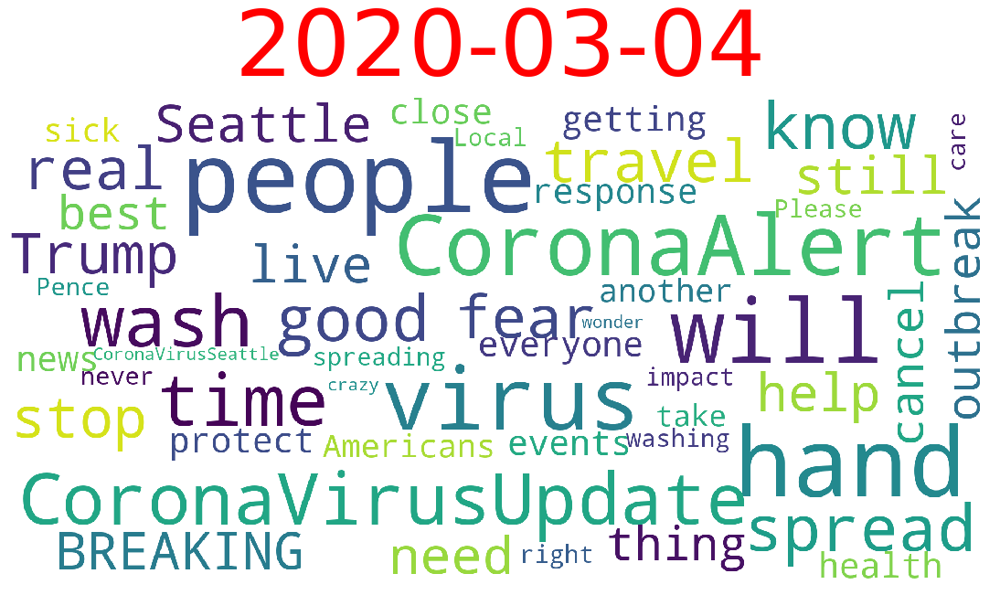

In [62]:
dates, snapshots = zip(*[ (date, get_word_count('\n'.join(group["clean_tweet"]))) \
                  for date, group in df_others.groupby("creation_date") ])
frames = np.arange(len(dates))
fig = plt.figure(figsize=(15,15))
ax = fig.add_axes([0,0,1,1])
ax.axis('off')
a = snapshots[0]
im = ax.imshow(a)
ttl = ax.set_title(dates[0], fontdict={"fontsize": 100, "color": "r"})

def animate_func(i):
    im.set_array(snapshots[i])
    ttl.set_text(dates[i])
    return [im]
anim_others = animation.FuncAnimation(
                               fig, 
                               animate_func, 
                               frames = frames,
                               interval = 1000,
                               )

In [63]:
anim_others